# Project: Wrangling and Analyze Data

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import requests
import json
import seaborn as sns
%matplotlib inline

In [2]:
twt_arch = pd.read_csv('twitter-archive-enhanced.csv')
twt_arch.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [3]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

In [4]:
with open('image-predictions.tsv', mode='wb') as file:
    file.write(response.content)

In [5]:
img_pred = pd.read_csv('image-predictions.tsv', sep='\t')
img_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

I couldn't get twitter's API due to authentication reasons, I'll definitely try to do this later. Below is the code to generate the API, but I'll be using the json file provided by the classroom. The file needed a bit of formatting, so I did that using vscode

In [6]:
# import tweepy
# from tweepy import OAuthHandler
# import json
# from timeit import default_timer as timer

# # Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# # These are hidden to comply with Twitter's API terms and conditions
# consumer_key = 'HIDDEN'
# consumer_secret = 'HIDDEN'
# access_token = 'HIDDEN'
# access_secret = 'HIDDEN'

# auth = OAuthHandler(consumer_key, consumer_secret)
# auth.set_access_token(access_token, access_secret)

# api = tweepy.API(auth, wait_on_rate_limit=True)

# # NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# # df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# # change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# # NOTE TO REVIEWER: this student had mobile verification issues so the following
# # Twitter API code was sent to this student from a Udacity instructor
# # Tweet IDs for which to gather additional data via Twitter's API
# tweet_ids = df_1.tweet_id.values
# len(tweet_ids)

# # Query Twitter's API for JSON data for each tweet ID in the Twitter archive
# count = 0
# fails_dict = {}
# start = timer()
# # Save each tweet's returned JSON as a new line in a .txt file
# with open('tweet_json.txt', 'w') as outfile:
#     # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
#     for tweet_id in tweet_ids:
#         count += 1
#         print(str(count) + ": " + str(tweet_id))
#         try:
#             tweet = api.get_status(tweet_id, tweet_mode='extended')
#             print("Success")
#             json.dump(tweet._json, outfile)
#             outfile.write('\n')
#         except tweepy.TweepError as e:
#             print("Fail")
#             fails_dict[tweet_id] = e
#             pass
# end = timer()
# print(end - start)
# print(fails_dict)

In [7]:
twt_json = pd.read_json('tweet_json.json')
twt_json.head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336200,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877700, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343400,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625000, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084900,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858700,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688300,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041000, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN


## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



##### Visual Assessment

In [8]:
#setting view options to display all the data for visual assessment
pd.set_option("display.max_rows", 2500)
pd.set_option("display.max_columns", 100)
twt_arch

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


In [9]:
img_pred

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [10]:
twt_json

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336200,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877700, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343400,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625000, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084900,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,4328,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858700,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8964,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688300,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041000, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,9774,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
5,2017-07-29 00:08:17+00:00,891087950875897900,891087950875897856,Here we have a majestic great white breaching ...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891087942176911400, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,3261,20562,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
6,2017-07-28 16:27:12+00:00,890971913173991400,890971913173991424,Meet Jax. He enjoys ice cream so much he gets ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890971906207338500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,2158,12041,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
7,2017-07-28 00:22:40+00:00,890729181411237900,890729181411237888,When you watch your owner call another dog a g...,False,"[0, 118]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890729118844600300, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,16716,56848,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
8,2017-07-27 16:25:51+00:00,890609185150312400,890609185150312448,

##### Programmatic Assessment

In [11]:
twt_arch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [12]:
twt_arch.isnull().sum()/len(twt_arch) * 100

tweet_id                       0.000000
in_reply_to_status_id         96.689304
in_reply_to_user_id           96.689304
timestamp                      0.000000
source                         0.000000
text                           0.000000
retweeted_status_id           92.317487
retweeted_status_user_id      92.317487
retweeted_status_timestamp    92.317487
expanded_urls                  2.504244
rating_numerator               0.000000
rating_denominator             0.000000
name                           0.000000
doggo                          0.000000
floofer                        0.000000
pupper                         0.000000
puppo                          0.000000
dtype: float64

In [13]:
#checking if data is duplicated
twt_arch.duplicated().sum()

0

In [14]:
twt_arch.shape

(2356, 17)

In [15]:
img_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [16]:
img_pred.shape

(2075, 12)

In [17]:
img_pred.duplicated().sum()

0

In [18]:
twt_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

In [19]:
twt_json.isnull().sum()/len(twt_json) * 100

created_at                         0.000000
id                                 0.000000
id_str                             0.000000
full_text                          0.000000
truncated                          0.000000
display_text_range                 0.000000
entities                           0.000000
extended_entities                 11.937128
source                             0.000000
in_reply_to_status_id             96.686491
in_reply_to_status_id_str         96.686491
in_reply_to_user_id               96.686491
in_reply_to_user_id_str           96.686491
in_reply_to_screen_name           96.686491
user                               0.000000
geo                              100.000000
coordinates                      100.000000
place                             99.957519
contributors                     100.000000
is_quote_status                    0.000000
retweet_count                      0.000000
favorite_count                     0.000000
favorited                       

### Quality issues
- twitter_archive table
    1. missing values in columns(in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp)
    2. tweet_id column datatype is int instead of string, timestamp is object instead of datetime
    3. records from retweets instead of only original data from @dog_rates 
- image_prediction table
    4. tweet_id column datatype is int instead of string
    5. non-decriptive column headers
- twitter_json table
    6. datatype in columns (in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) are float instead of string
    7. missing values in columns(contributors, coordinates, extended_entities, geo, in_reply_to_screen_name, in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, place, possibly_sensitive, possibly_sensitive_appealable, quoted_status, quoted_status_id, quoted_status_id_str, retweeted_status)
    8. id_str column datatype is int instead of string

### Tidiness issues
1. dog_type values have their own columns in the twitter_archive table
2. two representations of id columns (in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) in twitter_json table
3. individual tables instead of merged master dataset

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [20]:
# Make copies of original pieces of data
twt_arch_cleaned = twt_arch.copy()
img_pred_cleaned = img_pred.copy()
twt_json_cleaned = twt_json.copy()

### Issue #1:
missing values in columns(in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp, expanded_urls)

#### Define: 
- Drop columns (in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp) because of large amount of missing values.
- Drop missing records in expanded_urls column because missing values are few (just 59 records), also because missing values can't be imputted

#### Code

In [21]:
twt_arch_cleaned.isnull().sum()/len(twt_arch_cleaned) * 100

tweet_id                       0.000000
in_reply_to_status_id         96.689304
in_reply_to_user_id           96.689304
timestamp                      0.000000
source                         0.000000
text                           0.000000
retweeted_status_id           92.317487
retweeted_status_user_id      92.317487
retweeted_status_timestamp    92.317487
expanded_urls                  2.504244
rating_numerator               0.000000
rating_denominator             0.000000
name                           0.000000
doggo                          0.000000
floofer                        0.000000
pupper                         0.000000
puppo                          0.000000
dtype: float64

In [22]:
twt_arch_cleaned.isnull().sum()

tweet_id                         0
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                        0
source                           0
text                             0
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                   59
rating_numerator                 0
rating_denominator               0
name                             0
doggo                            0
floofer                          0
pupper                           0
puppo                            0
dtype: int64

In [23]:
twt_arch_cleaned.drop(columns=['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 
                               'retweeted_status_user_id', 'retweeted_status_timestamp'], inplace=True )

In [24]:
twt_arch_cleaned.dropna(inplace=True)

#### Test

In [25]:
twt_arch_cleaned.isnull().sum()

tweet_id              0
timestamp             0
source                0
text                  0
expanded_urls         0
rating_numerator      0
rating_denominator    0
name                  0
doggo                 0
floofer               0
pupper                0
puppo                 0
dtype: int64

No more records with missing values

### Issue #2:
tweet_id column datatype is int instead of string, timestamp column is object instead of datetime (in twitter_archive table)

#### Define
- Change tweet_id column datatype from int to string
- Change timestamp column datatype from string to datetime 

#### Code

In [26]:
twt_arch_cleaned.tweet_id = twt_arch_cleaned.tweet_id.astype(str)

In [27]:
twt_arch_cleaned.timestamp = pd.to_datetime(twt_arch_cleaned.timestamp)

#### Test

In [28]:
twt_arch_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2297 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2297 non-null   object             
 1   timestamp           2297 non-null   datetime64[ns, UTC]
 2   source              2297 non-null   object             
 3   text                2297 non-null   object             
 4   expanded_urls       2297 non-null   object             
 5   rating_numerator    2297 non-null   int64              
 6   rating_denominator  2297 non-null   int64              
 7   name                2297 non-null   object             
 8   doggo               2297 non-null   object             
 9   floofer             2297 non-null   object             
 10  pupper              2297 non-null   object             
 11  puppo               2297 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(2

The tweet_id column has been changed to string 

### Issue #3:
records from retweets instead of only original data from @dog_rates

#### Define
- remove records that are not from @dog_rate's official twitter account

#### Code

In [29]:
twt_arch_cleaned.sample(10)

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
368,828708714936930305,2017-02-06 20:55:28+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Fiona. She's an exotic dog. Seems rath...,https://twitter.com/dog_rates/status/828708714...,10,10,Fiona,None,None,None,None
1101,735635087207878657,2016-05-26 00:54:06+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Dakota. He hasn't grow into his skin y...,https://twitter.com/dog_rates/status/735635087...,11,10,Dakota,None,None,None,None
1442,696754882863349760,2016-02-08 17:58:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Reptar. He specifically asked for his ...,https://twitter.com/dog_rates/status/696754882...,10,10,Reptar,None,None,None,None
2167,669359674819481600,2015-11-25 03:39:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Saydee. She's a Rochester Ecclesiastical...,https://twitter.com/dog_rates/status/669359674...,11,10,Saydee,None,None,None,None
833,768554158521745409,2016-08-24 21:02:45+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Nollie. She's waving at...,https://twitter.com/dog_rates/status/739979191...,12,10,Nollie,None,None,None,None
909,757725642876129280,2016-07-25 23:54:05+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Beckham. He fell asleep at the wheel. ...,https://twitter.com/dog_rates/status/757725642...,11,10,Beckham,None,None,None,None
787,774639387460112384,2016-09-10 16:03:16+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Sprinkles. He's trapped in light jail....,https://twitter.com/dog_rates/status/774639387...,10,10,Sprinkles,None,None,None,None
700,786233965241827333,2016-10-12 15:55:59+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Mattie. She's extremely dangerous. Wil...,https://twitter.com/dog_rates/status/786233965...,11,10,Mattie,None,None,None,None
1476,693629975228977152,2016-01-31 03:00:47+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This pupper is afraid of its own feet. 12/10 w...,https://twitter.com/dog_rates/status/693629975...,12,10,None,None,None,pupper,None
475,816062466425819140,2017-01-02 23:23:48+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Jack. He's one of the rare...,https://www.gofundme.com/surgeryforjacktheminp...,11,10,Jack,None,None,None,None


Records that are from @dog_rate's official twitter account have expanded_urls that start with 'https://twitter.com/dog_rates'. So we'll remove those that don't start with that.

In [30]:
#creating a helper function
def original_tweets(expanded_urls):
    if expanded_urls[0:29] ==  'https://twitter.com/dog_rates':
        return 1
    else:
        return 0

In [31]:
twt_arch_cleaned['original_tweets'] = twt_arch_cleaned.apply(lambda x: original_tweets(x['expanded_urls']),axis=1)

In [32]:
twt_arch_cleaned['original_tweets'].value_counts()

1    2099
0     198
Name: original_tweets, dtype: int64

In [33]:
#dropping records that are retweets
twt_arch_cleaned = twt_arch_cleaned[twt_arch_cleaned['original_tweets'] == 1]

In [34]:
twt_arch_cleaned.shape

(2099, 13)

In [35]:
#dropping original_tweets column
twt_arch_cleaned.drop('original_tweets', axis=1, inplace=True)

#### Test

In [36]:
twt_arch_cleaned

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,2017-07-29 00:08:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
7,890729181411237888,2017-07-28 00:22:40+00:00,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,2017-07-27 16:25:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None
10,890006608113172480,2017-07-26 00:31:25+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Koda. He is a South Australian decksha...,https://twitter.com/dog_rates/status/890006608...,13,10,Koda,None,None,None,None


Only tweets from the dog_rates official account is in the table now

### Issue #4:
tweet_id column datatype is int instead of string (in the image prediction table)

#### Define

- Change tweet_id column datatype from int to string

#### Code

In [37]:
img_pred_cleaned.tweet_id = img_pred_cleaned.tweet_id.astype(str)

#### Test

In [38]:
img_pred_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


Tweet ID has been changed to string

### Issue #5:
non-decriptive column headers

#### Define

- Change non-decriptive column headers in img_pred table to be more descriptive

#### Code

In [39]:
img_pred_cleaned.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [40]:
img_pred_cleaned = img_pred_cleaned.rename(columns={'p1':'prediction1', 'p1_conf':'prediction1_confidence', 'p1_dog':'prediction1_is_dog',
                         'p2':'prediction2', 'p2_conf':'prediction2_confidence', 'p2_dog':'prediction2_is_dog',
                         'p3':'prediction3', 'p3_conf':'prediction3_confidence', 'p3_dog':'prediction3_is_dog'})

#### Test

In [41]:
img_pred_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   tweet_id                2075 non-null   object 
 1   jpg_url                 2075 non-null   object 
 2   img_num                 2075 non-null   int64  
 3   prediction1             2075 non-null   object 
 4   prediction1_confidence  2075 non-null   float64
 5   prediction1_is_dog      2075 non-null   bool   
 6   prediction2             2075 non-null   object 
 7   prediction2_confidence  2075 non-null   float64
 8   prediction2_is_dog      2075 non-null   bool   
 9   prediction3             2075 non-null   object 
 10  prediction3_confidence  2075 non-null   float64
 11  prediction3_is_dog      2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


Column names are now more descriptive

### Issue #6:
datatype in columns (in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) are float instead of string

#### Define: 
- Change datatype in columns(in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) to string.

#### Code

In [42]:
twt_json_cleaned.in_reply_to_status_id = twt_json_cleaned.in_reply_to_status_id.astype(str)
twt_json_cleaned.in_reply_to_status_id_str = twt_json_cleaned.in_reply_to_status_id_str.astype(str)
twt_json_cleaned.in_reply_to_user_id = twt_json_cleaned.in_reply_to_user_id.astype(str)
twt_json_cleaned.in_reply_to_user_id_str = twt_json_cleaned.in_reply_to_user_id_str.astype(str)
twt_json_cleaned.quoted_status_id = twt_json_cleaned.quoted_status_id.astype(str)
twt_json_cleaned.quoted_status_id_str = twt_json_cleaned.quoted_status_id_str.astype(str)

#### Test

In [43]:
twt_json_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          2354 non-null   object             
 10  in_reply_to_status_id_st

Datatypes have been changed

### Issue #7:
missing values in colums(contributors, coordinates, extended_entities, geo, in_reply_to_screen_name, in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, place, possibly_sensitive, possibly_sensitive_appealable, quoted_status, quoted_status_id, quoted_status_id_str, retweeted_status)

#### Define

- Drop columns(contributors, coordinates, geo, in_reply_to_screen_name, in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, place, quoted_status, quoted_status_id, quoted_status_id_str, retweeted_status)
- Fill missing values in possibly_sensitive and possibly_sensitive_appealable columns because most records have one value
- Drop missing records in extended_entities column because the missing values can't be imputted

#### Code

In [44]:
twt_json_cleaned.isnull().sum()/len(twt_json_cleaned) * 100

created_at                         0.000000
id                                 0.000000
id_str                             0.000000
full_text                          0.000000
truncated                          0.000000
display_text_range                 0.000000
entities                           0.000000
extended_entities                 11.937128
source                             0.000000
in_reply_to_status_id              0.000000
in_reply_to_status_id_str          0.000000
in_reply_to_user_id                0.000000
in_reply_to_user_id_str            0.000000
in_reply_to_screen_name           96.686491
user                               0.000000
geo                              100.000000
coordinates                      100.000000
place                             99.957519
contributors                     100.000000
is_quote_status                    0.000000
retweet_count                      0.000000
favorite_count                     0.000000
favorited                       

In [45]:
twt_json_cleaned.drop(columns=['contributors', 'coordinates', 'geo', 'in_reply_to_screen_name', 'in_reply_to_status_id', 
                               'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'place', 
                               'quoted_status', 'quoted_status_id', 'quoted_status_id_str', 'retweeted_status'], inplace=True)

In [46]:
twt_json_cleaned.isnull().sum()

created_at                         0
id                                 0
id_str                             0
full_text                          0
truncated                          0
display_text_range                 0
entities                           0
extended_entities                281
source                             0
user                               0
is_quote_status                    0
retweet_count                      0
favorite_count                     0
favorited                          0
retweeted                          0
possibly_sensitive               143
possibly_sensitive_appealable    143
lang                               0
dtype: int64

In [47]:
twt_json_cleaned['possibly_sensitive'] = twt_json_cleaned['possibly_sensitive'].fillna(twt_json_cleaned['possibly_sensitive'].median())
twt_json_cleaned['possibly_sensitive_appealable'] = twt_json_cleaned['possibly_sensitive'].fillna(twt_json_cleaned['possibly_sensitive_appealable'].median())

In [48]:
twt_json_cleaned.dropna(inplace=True)

#### Test

In [49]:
twt_json_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2073 entries, 0 to 2353
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2073 non-null   datetime64[ns, UTC]
 1   id                             2073 non-null   int64              
 2   id_str                         2073 non-null   int64              
 3   full_text                      2073 non-null   object             
 4   truncated                      2073 non-null   bool               
 5   display_text_range             2073 non-null   object             
 6   entities                       2073 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2073 non-null   object             
 9   user                           2073 non-null   object             
 10  is_quote_status         

In [50]:
twt_json_cleaned.isnull().sum()

created_at                       0
id                               0
id_str                           0
full_text                        0
truncated                        0
display_text_range               0
entities                         0
extended_entities                0
source                           0
user                             0
is_quote_status                  0
retweet_count                    0
favorite_count                   0
favorited                        0
retweeted                        0
possibly_sensitive               0
possibly_sensitive_appealable    0
lang                             0
dtype: int64

No more missing values in the dataset

### Issue #8:
id column and id_str column datatype is int instead of string(in twitter json file)

#### Define

- id_str datatype from int to string

#### Code

In [51]:
twt_json_cleaned.id_str = twt_json_cleaned.id_str.astype(str)

#### Test

In [52]:
twt_json_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2073 entries, 0 to 2353
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2073 non-null   datetime64[ns, UTC]
 1   id                             2073 non-null   int64              
 2   id_str                         2073 non-null   object             
 3   full_text                      2073 non-null   object             
 4   truncated                      2073 non-null   bool               
 5   display_text_range             2073 non-null   object             
 6   entities                       2073 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2073 non-null   object             
 9   user                           2073 non-null   object             
 10  is_quote_status         

id column datatype has been changed from int to string

### Issue #9:
dog_type values have their own columns in the twitter_archive table

#### Define
- melt columns with dog_type values to one column called dog_type

#### Code

In [53]:
twt_arch_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2099 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2099 non-null   object             
 1   timestamp           2099 non-null   datetime64[ns, UTC]
 2   source              2099 non-null   object             
 3   text                2099 non-null   object             
 4   expanded_urls       2099 non-null   object             
 5   rating_numerator    2099 non-null   int64              
 6   rating_denominator  2099 non-null   int64              
 7   name                2099 non-null   object             
 8   doggo               2099 non-null   object             
 9   floofer             2099 non-null   object             
 10  pupper              2099 non-null   object             
 11  puppo               2099 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(2

In [54]:
twt_arch_cleaned = pd.melt(twt_arch_cleaned, 
                           id_vars=['tweet_id', 'timestamp', 'source', 'text', 'rating_numerator', 'rating_denominator',
                                    'name', 'expanded_urls'], var_name ='dog_type_placeholder', value_name='dog_type')

In [55]:
#deleting the placeholder
twt_arch_cleaned.drop('dog_type_placeholder', axis=1, inplace=True)

In [56]:
#Checking for duplicates
twt_arch_cleaned.duplicated().sum()

5958

In [57]:
#drop duplicates
twt_arch_cleaned.drop_duplicates(inplace=True)

#### Test

In [58]:
twt_arch_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2438 entries, 0 to 7216
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2438 non-null   object             
 1   timestamp           2438 non-null   datetime64[ns, UTC]
 2   source              2438 non-null   object             
 3   text                2438 non-null   object             
 4   rating_numerator    2438 non-null   int64              
 5   rating_denominator  2438 non-null   int64              
 6   name                2438 non-null   object             
 7   expanded_urls       2438 non-null   object             
 8   dog_type            2438 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(2), object(6)
memory usage: 190.5+ KB


In [59]:
twt_arch_cleaned

,tweet_id,timestamp,source,text,rating_numerator,rating_denominator,name,expanded_urls,dog_type
0,892420643555336193,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,https://twitter.com/dog_rates/status/892420643...,None
1,892177421306343426,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,13,10,Tilly,https://twitter.com/dog_rates/status/892177421...,None
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,12,10,Archie,https://twitter.com/dog_rates/status/891815181...,None
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,13,10,Darla,https://twitter.com/dog_rates/status/891689557...,None
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,12,10,Franklin,https://twitter.com/dog_rates/status/891327558...,None
5,891087950875897856,2017-07-29 00:08:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,13,10,None,https://twitter.com/dog_rates/status/891087950...,None
6,890729181411237888,2017-07-28 00:22:40+00:00,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,13,10,None,https://twitter.com/dog_rates/status/890729181...,None
7,890609185150312448,2017-07-27 16:25:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,13,10,Zoey,https://twitter.com/dog_rates/status/890609185...,None
8,890240255349198849,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,14,10,Cassie,https://twitter.com/dog_rates/status/890240255...,doggo
9,890006608113172480,2017-07-26 00:31:25+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Koda. He is a South Australian decksha...,13,10,Koda,https://twitter.com/dog_rates/status/890006608...,None


dog_type values have been melted into one column called dog_type

### Issue #10:
two representations of id columns (id, id_str in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) in twitter_json table

#### Define

- Duplicate columns(in_reply_to_status_id, in_reply_to_status_id_str, in_reply_to_user_id, in_reply_to_user_id_str, quoted_status_id, quoted_status_id_str) has been fixed by dropping missing values earlier. 
- So we'll drop the id column because the datatype is int and the numbers have been rounded up. We'll also change the column name id_str to id

#### Code

In [60]:
twt_json_cleaned.drop('id', axis=1, inplace=True)

In [61]:
twt_json_cleaned.rename({'id_str':'id'}, axis=1, inplace=True)

#### Test

In [62]:
twt_json_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2073 entries, 0 to 2353
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2073 non-null   datetime64[ns, UTC]
 1   id                             2073 non-null   object             
 2   full_text                      2073 non-null   object             
 3   truncated                      2073 non-null   bool               
 4   display_text_range             2073 non-null   object             
 5   entities                       2073 non-null   object             
 6   extended_entities              2073 non-null   object             
 7   source                         2073 non-null   object             
 8   user                           2073 non-null   object             
 9   is_quote_status                2073 non-null   bool               
 10  retweet_count           

### Issue #11:
individual tables instead of merged master dataset

#### Define
Merge individual tables to one master table

#### Code

In [63]:
helper_table = pd.merge(twt_arch_cleaned, img_pred_cleaned, on= 'tweet_id', how='outer')

In [64]:
helper_table.isnull().sum()

tweet_id                   0
timestamp                 43
source                    43
text                      43
rating_numerator          43
rating_denominator        43
name                      43
expanded_urls             43
dog_type                  43
jpg_url                   82
img_num                   82
prediction1               82
prediction1_confidence    82
prediction1_is_dog        82
prediction2               82
prediction2_confidence    82
prediction2_is_dog        82
prediction3               82
prediction3_confidence    82
prediction3_is_dog        82
dtype: int64

In [65]:
twitter_archive_master = pd.merge(helper_table, twt_json_cleaned, how='outer', left_on='tweet_id', right_on='id')

In [66]:
#check for missing values in our new data
twitter_archive_master.isnull().sum()

tweet_id                         724
timestamp                        767
source_x                         767
text                             767
rating_numerator                 767
rating_denominator               767
name                             767
expanded_urls                    767
dog_type                         767
jpg_url                          806
img_num                          806
prediction1                      806
prediction1_confidence           806
prediction1_is_dog               806
prediction2                      806
prediction2_confidence           806
prediction2_is_dog               806
prediction3                      806
prediction3_confidence           806
prediction3_is_dog               806
created_at                       918
id                               918
full_text                        918
truncated                        918
display_text_range               918
entities                         918
extended_entities                918
s

In [67]:
twitter_archive_master.shape

(3205, 37)

In [68]:
# dropping missing values in our master data frame
twitter_archive_master.dropna(inplace=True)

In [69]:
twitter_archive_master.shape

(1538, 37)

#### Test

In [70]:
twitter_archive_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538 entries, 2 to 2436
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   tweet_id                       1538 non-null   object             
 1   timestamp                      1538 non-null   datetime64[ns, UTC]
 2   source_x                       1538 non-null   object             
 3   text                           1538 non-null   object             
 4   rating_numerator               1538 non-null   float64            
 5   rating_denominator             1538 non-null   float64            
 6   name                           1538 non-null   object             
 7   expanded_urls                  1538 non-null   object             
 8   dog_type                       1538 non-null   object             
 9   jpg_url                        1538 non-null   object             
 10  img_num                 

In [71]:
#dropping duplicate ids
twitter_archive_master.drop('id', axis=1, inplace=True)

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [72]:
twitter_archive_master.to_csv('twitter_archive_master.csv')

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

In [73]:
twitter_archive_master.shape

(1538, 36)

In [74]:
twitter_archive_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538 entries, 2 to 2436
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   tweet_id                       1538 non-null   object             
 1   timestamp                      1538 non-null   datetime64[ns, UTC]
 2   source_x                       1538 non-null   object             
 3   text                           1538 non-null   object             
 4   rating_numerator               1538 non-null   float64            
 5   rating_denominator             1538 non-null   float64            
 6   name                           1538 non-null   object             
 7   expanded_urls                  1538 non-null   object             
 8   dog_type                       1538 non-null   object             
 9   jpg_url                        1538 non-null   object             
 10  img_num                 

In [75]:
twitter_archive_master.head()

,tweet_id,timestamp,source_x,text,rating_numerator,rating_denominator,name,expanded_urls,dog_type,jpg_url,img_num,prediction1,prediction1_confidence,prediction1_is_dog,prediction2,prediction2_confidence,prediction2_is_dog,prediction3,prediction3_confidence,prediction3_is_dog,created_at,full_text,truncated,display_text_range,entities,extended_entities,source_y,user,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang
2,891815181378084864,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,12.0,10.0,Archie,https://twitter.com/dog_rates/status/891815181...,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,4328.0,25461.0,False,False,0.0,0.0,en
3,891689557279858688,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,13.0,10.0,Darla,https://twitter.com/dog_rates/status/891689557...,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799500, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,8964.0,42908.0,False,False,0.0,0.0,en
4,891327558926688256,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,12.0,10.0,Franklin,https://twitter.com/dog_rates/status/891327558...,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041000, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,9774.0,41048.0,False,False,0.0,0.0,en
5,891087950875897856,2017-07-29 00:08:17+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,13.0,10.0,None,https://twitter.com/dog_rates/status/891087950...,None,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1.0,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,0.116317,True,Indian_elephant,0.076902,False,2017-07-29 00:08:17+00:00,Here we have a majestic great white breaching ...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891087942176911400, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,3261.0,20562.0,False,False,0.0,0.0,en
6,890729181411237888,2017-07-28 00:22:40+00:00,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,13.0,10.0,None,https://twitter.com/dog_rates/status/890729181...,None,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2.0,Pomeranian,0.566142,True,Eskimo_dog,0.178406,True,Pembroke,0.076507,True,2017-07-28 00:22:40+00:00,When you watch your owner call another dog a g...,False,"[0, 118]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890729118844600300, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,16716.0,56848.0,False,False,0.

In [76]:
twitter_archive_master.img_num.value_counts()

1.0    1338
2.0     126
3.0      55
4.0      19
Name: img_num, dtype: int64

In [77]:
# Making a copy of the dataset for analysis
df = twitter_archive_master.copy()

In [78]:
df.columns

Index(['tweet_id', 'timestamp', 'source_x', 'text', 'rating_numerator',
       'rating_denominator', 'name', 'expanded_urls', 'dog_type', 'jpg_url',
       'img_num', 'prediction1', 'prediction1_confidence',
       'prediction1_is_dog', 'prediction2', 'prediction2_confidence',
       'prediction2_is_dog', 'prediction3', 'prediction3_confidence',
       'prediction3_is_dog', 'created_at', 'full_text', 'truncated',
       'display_text_range', 'entities', 'extended_entities', 'source_y',
       'user', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive',
       'possibly_sensitive_appealable', 'lang'],
      dtype='object')

In [79]:
#dropping columns that are irrelevant for my analysis
df.drop(columns=['jpg_url', 'source_x', 'text', 'expanded_urls', 'created_at', 'truncated', 'entities', 'extended_entities', 'source_y', 'user', 
                 'is_quote_status', 'possibly_sensitive', 'possibly_sensitive_appealable', 'lang', 'favorited', 'retweeted', 'prediction2', 
                 'prediction2_confidence', 'prediction2_is_dog', 'prediction3', 'prediction3_confidence', 'prediction3_is_dog'], inplace=True)

In [80]:
df.head()

,tweet_id,timestamp,rating_numerator,rating_denominator,name,dog_type,img_num,prediction1,prediction1_confidence,prediction1_is_dog,full_text,display_text_range,retweet_count,favorite_count
2,891815181378084864,2017-07-31 00:18:03+00:00,12.0,10.0,Archie,None,1.0,Chihuahua,0.716012,True,This is Archie. He is a rare Norwegian Pouncin...,"[0, 121]",4328.0,25461.0
3,891689557279858688,2017-07-30 15:58:51+00:00,13.0,10.0,Darla,None,1.0,paper_towel,0.170278,False,This is Darla. She commenced a snooze mid meal...,"[0, 79]",8964.0,42908.0
4,891327558926688256,2017-07-29 16:00:24+00:00,12.0,10.0,Franklin,None,2.0,basset,0.555712,True,This is Franklin. He would like you to stop ca...,"[0, 138]",9774.0,41048.0
5,891087950875897856,2017-07-29 00:08:17+00:00,13.0,10.0,None,None,1.0,Chesapeake_Bay_retriever,0.425595,True,Here we have a majestic great white breaching ...,"[0, 138]",3261.0,20562.0
6,890729181411237888,2017-07-28 00:22:40+00:00,13.0,10.0,None,None,2.0,Pomeranian,0.566142,True,When you watch your owner call another dog a g...,"[0, 118]",16716.0,56848.0


#### Questions to Answer from the Dataset
- Is rating_numerator related to dog type
- Is rating_numerator related to size of text
- Days or months with most retweets
- Days or months with most likes

In [81]:
#Rating_numerator will serve as our target variable
df.rating_numerator.value_counts()

10.0      353
12.0      341
11.0      311
13.0      190
9.0       109
8.0        76
7.0        40
14.0       25
6.0        23
5.0        22
4.0        13
3.0        13
2.0         5
1.0         4
27.0        2
75.0        1
165.0       1
1776.0      1
204.0       1
45.0        1
60.0        1
44.0        1
143.0       1
144.0       1
88.0        1
420.0       1
Name: rating_numerator, dtype: int64

In [82]:
#creating a categorical bin for rating_numerator
def ratings(ratings_numerator):
    if ratings_numerator >= 1 and ratings_numerator <= 5:
        return 1
    elif ratings_numerator >= 10 and ratings_numerator <=15:
        return 2
    elif ratings_numerator >= 20 and ratings_numerator <=25:
        return 3
    elif ratings_numerator >= 25 and ratings_numerator <=100:
        return 4
    elif ratings_numerator >= 100:
        return 5

In [83]:
df['ratings'] = df.apply(lambda x: ratings(x.rating_numerator), axis=1)

In [84]:
df.head()

,tweet_id,timestamp,rating_numerator,rating_denominator,name,dog_type,img_num,prediction1,prediction1_confidence,prediction1_is_dog,full_text,display_text_range,retweet_count,favorite_count,ratings
2,891815181378084864,2017-07-31 00:18:03+00:00,12.0,10.0,Archie,None,1.0,Chihuahua,0.716012,True,This is Archie. He is a rare Norwegian Pouncin...,"[0, 121]",4328.0,25461.0,2.0
3,891689557279858688,2017-07-30 15:58:51+00:00,13.0,10.0,Darla,None,1.0,paper_towel,0.170278,False,This is Darla. She commenced a snooze mid meal...,"[0, 79]",8964.0,42908.0,2.0
4,891327558926688256,2017-07-29 16:00:24+00:00,12.0,10.0,Franklin,None,2.0,basset,0.555712,True,This is Franklin. He would like you to stop ca...,"[0, 138]",9774.0,41048.0,2.0
5,891087950875897856,2017-07-29 00:08:17+00:00,13.0,10.0,None,None,1.0,Chesapeake_Bay_retriever,0.425595,True,Here we have a majestic great white breaching ...,"[0, 138]",3261.0,20562.0,2.0
6,890729181411237888,2017-07-28 00:22:40+00:00,13.0,10.0,None,None,2.0,Pomeranian,0.566142,True,When you watch your owner call another dog a g...,"[0, 118]",16716.0,56848.0,2.0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


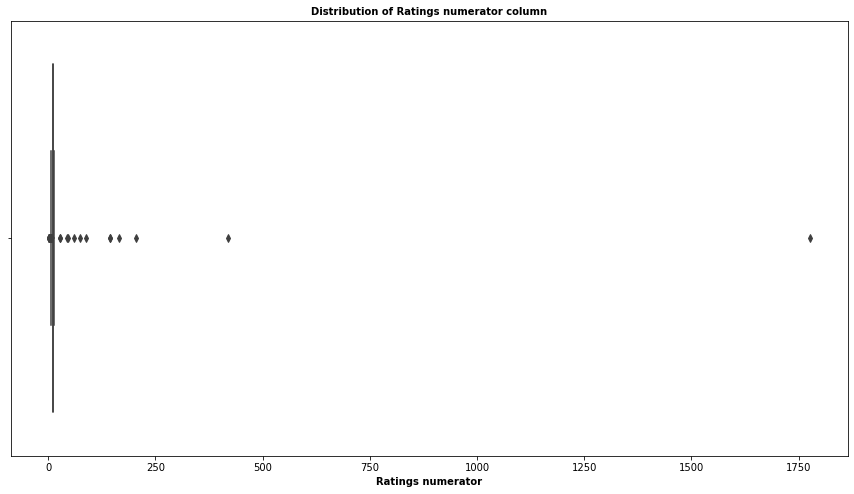

In [115]:
plt.figure(figsize=(15, 8))
sns.boxplot(df.rating_numerator)
plt.title('Distribution of Ratings numerator column', fontsize=10, weight="bold")
plt.xlabel('Ratings numerator', fontsize=10, weight="bold");

The image above shows that numerator ratings greater than 15 are outliers

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


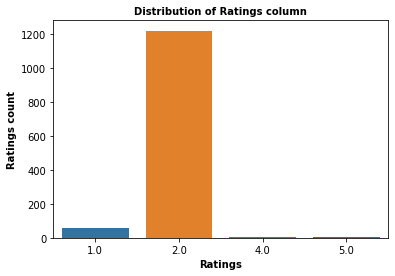

In [106]:
#we can visualize this distribution
t = sns.countplot(df.ratings)
plt.title('Distribution of Ratings column', fontsize=10, weight="bold")
plt.xlabel('Ratings', fontsize=10, weight="bold")
plt.ylabel('Ratings count', fontsize=10, weight="bold");

From the image above, we see that we have more ratings of 2. This means more dogs had the rating numerator between 10 and 15 

In [86]:
def group_plot(df, grpvar, yvar, figsize, mul=100):
    """This function groups data and creates a plot for the data.
    input:
        df: DataFrame 
        grpvar: variable to groupby (str)
        yvar: y variable --> dataframe column (str)
        figsize: (float, float) --> Width, height in inches.2
        mul: multiplies each value in the DataFrame with a specified value, default: 100
    output: returns a group plot
    """
    # Plot
    df.groupby(grpvar)[yvar].mean().mul(mul).plot.bar(edgecolor='black', figsize=figsize, rot=0, width=0.8);
    plt.title(f'Percentage {yvar} by {grpvar}'.title(), fontsize=10, weight="bold")
    plt.xlabel(grpvar.title(), fontsize=10, weight="bold")
    plt.ylabel(f'Percentage of {yvar}'.title(), fontsize=10, weight="bold")  

In [87]:
#We'll create another dataset where the column dog_type has no none values (dt_cleaned - dog_type cleaned)
dt_cleaned = df[df.dog_type != 'None']

In [88]:
dt_cleaned.groupby('dog_type')['ratings'].value_counts(normalize=True).unstack('ratings').mul(100)

ratings,1.0,2.0,4.0
dog_type,,,
doggo,2.500000,97.500000,NaN
floofer,NaN,100.000000,NaN
pupper,1.612903,97.580645,0.806452
puppo,NaN,100.000000,NaN


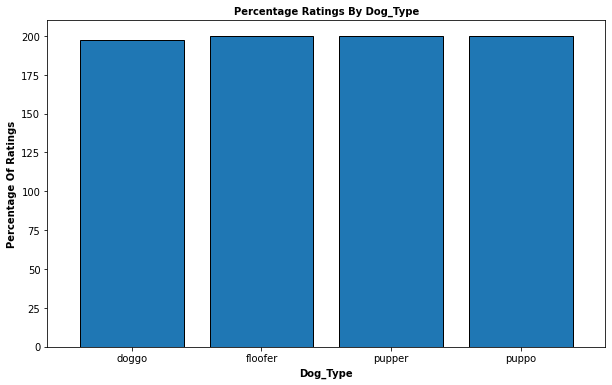

In [89]:
group_plot(dt_cleaned, 'dog_type', 'ratings', (10,6))

This plot shows us that there is no relationship between ratings and dog_type

In [90]:
df['text_length'] = df.display_text_range.str[1]

In [91]:
df.columns

Index(['tweet_id', 'timestamp', 'rating_numerator', 'rating_denominator',
       'name', 'dog_type', 'img_num', 'prediction1', 'prediction1_confidence',
       'prediction1_is_dog', 'full_text', 'display_text_range',
       'retweet_count', 'favorite_count', 'ratings', 'text_length'],
      dtype='object')

In [92]:
filtered_df = df[['rating_numerator', 'dog_type', 'retweet_count', 'favorite_count', 'ratings', 'text_length']]

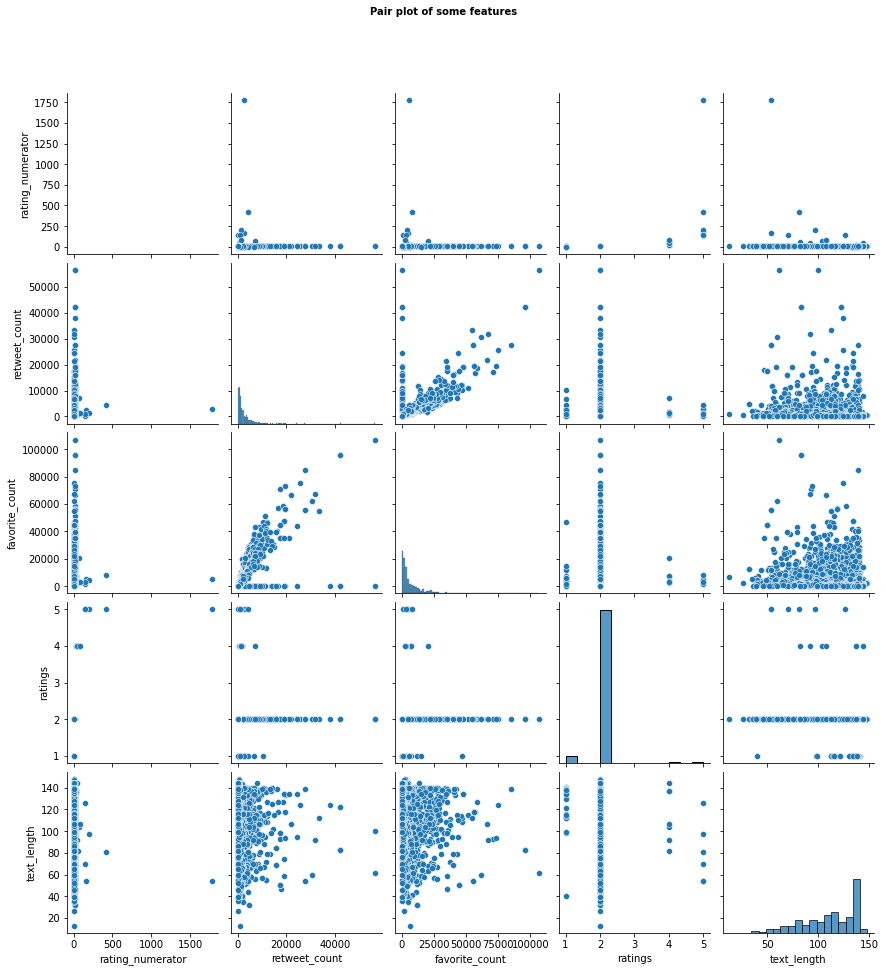

In [111]:
g = sns.pairplot(filtered_df)
plt.suptitle('Pair plot of some features', y=1.08, fontsize=10, weight="bold");

The plot shows that there's no relationship between ratings and text, but there's a positive correlation between retweet count and favourite count. There also seems to be an interesting correlation between the retweet count and favourite count columns and text length

In [94]:
df.head()

,tweet_id,timestamp,rating_numerator,rating_denominator,name,dog_type,img_num,prediction1,prediction1_confidence,prediction1_is_dog,full_text,display_text_range,retweet_count,favorite_count,ratings,text_length
2,891815181378084864,2017-07-31 00:18:03+00:00,12.0,10.0,Archie,None,1.0,Chihuahua,0.716012,True,This is Archie. He is a rare Norwegian Pouncin...,"[0, 121]",4328.0,25461.0,2.0,121
3,891689557279858688,2017-07-30 15:58:51+00:00,13.0,10.0,Darla,None,1.0,paper_towel,0.170278,False,This is Darla. She commenced a snooze mid meal...,"[0, 79]",8964.0,42908.0,2.0,79
4,891327558926688256,2017-07-29 16:00:24+00:00,12.0,10.0,Franklin,None,2.0,basset,0.555712,True,This is Franklin. He would like you to stop ca...,"[0, 138]",9774.0,41048.0,2.0,138
5,891087950875897856,2017-07-29 00:08:17+00:00,13.0,10.0,None,None,1.0,Chesapeake_Bay_retriever,0.425595,True,Here we have a majestic great white breaching ...,"[0, 138]",3261.0,20562.0,2.0,138
6,890729181411237888,2017-07-28 00:22:40+00:00,13.0,10.0,None,None,2.0,Pomeranian,0.566142,True,When you watch your owner call another dog a g...,"[0, 118]",16716.0,56848.0,2.0,118


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538 entries, 2 to 2436
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   tweet_id                1538 non-null   object             
 1   timestamp               1538 non-null   datetime64[ns, UTC]
 2   rating_numerator        1538 non-null   float64            
 3   rating_denominator      1538 non-null   float64            
 4   name                    1538 non-null   object             
 5   dog_type                1538 non-null   object             
 6   img_num                 1538 non-null   float64            
 7   prediction1             1538 non-null   object             
 8   prediction1_confidence  1538 non-null   float64            
 9   prediction1_is_dog      1538 non-null   object             
 10  full_text               1538 non-null   object             
 11  display_text_range      1538 non-null   obj

In [96]:
#getting dates
df['dates'] = df['timestamp'].dt.date

In [97]:
#getting year and month from dates
df['year'] = pd.DatetimeIndex(df['dates']).year
df['month'] = pd.DatetimeIndex(df['dates']).month


In [98]:
df.head()

,tweet_id,timestamp,rating_numerator,rating_denominator,name,dog_type,img_num,prediction1,prediction1_confidence,prediction1_is_dog,full_text,display_text_range,retweet_count,favorite_count,ratings,text_length,dates,year,month
2,891815181378084864,2017-07-31 00:18:03+00:00,12.0,10.0,Archie,None,1.0,Chihuahua,0.716012,True,This is Archie. He is a rare Norwegian Pouncin...,"[0, 121]",4328.0,25461.0,2.0,121,2017-07-31,2017,7
3,891689557279858688,2017-07-30 15:58:51+00:00,13.0,10.0,Darla,None,1.0,paper_towel,0.170278,False,This is Darla. She commenced a snooze mid meal...,"[0, 79]",8964.0,42908.0,2.0,79,2017-07-30,2017,7
4,891327558926688256,2017-07-29 16:00:24+00:00,12.0,10.0,Franklin,None,2.0,basset,0.555712,True,This is Franklin. He would like you to stop ca...,"[0, 138]",9774.0,41048.0,2.0,138,2017-07-29,2017,7
5,891087950875897856,2017-07-29 00:08:17+00:00,13.0,10.0,None,None,1.0,Chesapeake_Bay_retriever,0.425595,True,Here we have a majestic great white breaching ...,"[0, 138]",3261.0,20562.0,2.0,138,2017-07-29,2017,7
6,890729181411237888,2017-07-28 00:22:40+00:00,13.0,10.0,None,None,2.0,Pomeranian,0.566142,True,When you watch your owner call another dog a g...,"[0, 118]",16716.0,56848.0,2.0,118,2017-07-28,2017,7


In [99]:
df.groupby('year')[['retweet_count', 'favorite_count']].sum()

,retweet_count,favorite_count
year,,
2015,566177.0,1305771.0
2016,2294401.0,5932845.0
2017,1667288.0,5492417.0


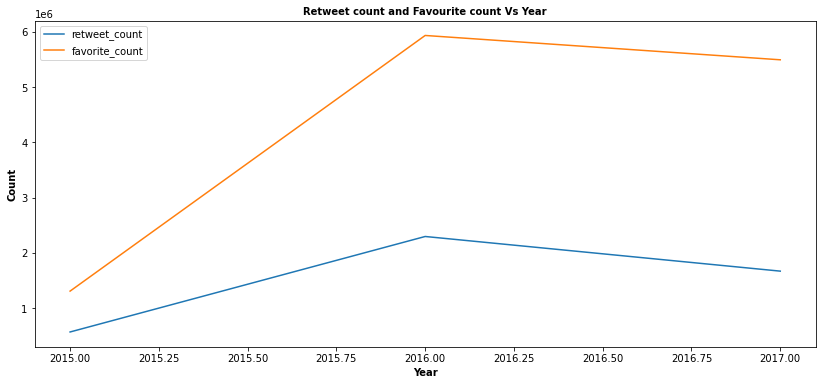

In [108]:
#plot year with the highest retweet count
df.groupby('year')[['retweet_count', 'favorite_count']].sum().plot(figsize=(14,6), legend=True)
plt.title('Retweet count and Favourite count Vs Year', fontsize=10, weight="bold")
plt.xlabel('Year', fontsize=10, weight="bold")
plt.ylabel('Count', fontsize=10, weight="bold");

In [101]:
df.year.value_counts()

2016    811
2015    493
2017    234
Name: year, dtype: int64

From here we can see that the year with the highest retweet and likes was the year 2016, however 2016 is also the year with the highest number of tweets, so this might be the reason for it's high retweet counts.
However we find that 2017 is the year with the lowest number of tweets, but the number of likes that year is almost up to that of 2016.

In [102]:
t= df[df.year == 2016]
t.groupby('month')[['retweet_count', 'favorite_count']].sum()

,retweet_count,favorite_count
month,,
1,213543.0,560514.0
2,139483.0,379939.0
3,124819.0,368737.0
4,77078.0,221800.0
5,138422.0,379315.0
6,173858.0,482232.0
7,260404.0,589733.0
8,148292.0,391818.0
9,256553.0,624696.0


We see that the month July had the highest retweet count and the month October had the highest likes in the year 2016

### Insights:
1. From the dataset more dogs had the rating numerator between 10 and 15.
2. We see that there's no relationship between ratings and dog_type.
3. There also is no relationship between ratings and length of text, but there seems to be a relationship between the favourite and retweet count column and length of text.
4. There's a positive relationship between retweet count and favourite count.
5. The year with the highest retweet and likes was the year 2016, however it was also the year with the highest number of tweets, so this might be the reason for it's high retweet counts.
However we find that 2017 is the year with the lowest number of tweets, but the number of likes that year is almost up to that of 2016.
6. The month July had the highest retweet count and the month October had the highest likes in the year 2016

Most of my analysis work involved finding relationships and correlation, it is important to note that these correlations don't mean causation.

### Visualization

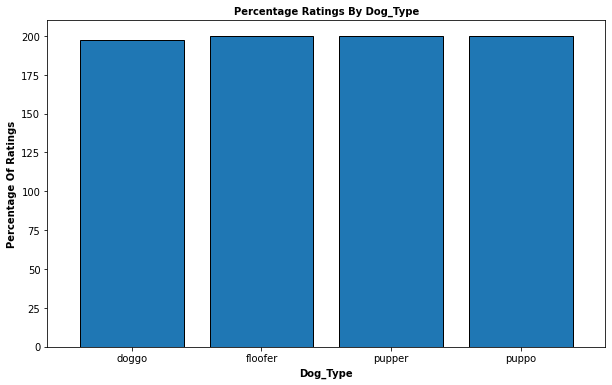

In [103]:
group_plot(dt_cleaned, 'dog_type', 'ratings', (10,6))